# Kraken Simulation of Caldera Environment

In [1]:
import numpy as np
from pyat.pyat import env
from matplotlib import pyplot as plt
import pyat_tools
import hvplot.xarray
from tqdm import tqdm
import scipy
import os
from scipy import signal
from pyat.pyat.readwrite import *

import xarray as xr
import hvplot.xarray

import pandas as pd
from Noise_Interferometry.Modules import inversion
import multiprocessing as mp

%load_ext autoreload
%autoreload 2

## Create Environment File

In [2]:
# Load SSP information
sspx = pyat_tools.load_ssp_from_file()
ssp_caldera_winter = pyat_tools.convert_SSP_arlpy(sspx.loc[:,15:1500], 0)
ssp_caldera_summer = pyat_tools.convert_SSP_arlpy(sspx.loc[:,15:1500], 190)

In [5]:
sspx.mean()

<xarray.DataArray 'SSP stitched' ()>
array(1480.7049238560742)

In [3]:
fn = '/Volumes/Ocean_Acoustics/CTD Data/Axial_Base_stitched_hourly.nc'
sspx = xr.load_dataarray(fn)
ssp = pyat_tools.convert_SSP_arlpy(sspx.mean('time').loc[15:1500], 0)

In [4]:
# Write Environment File
fn = 'caldera'
pyat_tools.build_env_file(ssp,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')

In [5]:
# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 30

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

N:	6000
To:	30 [s]
Δf	0.016666666666666666


In [6]:
# Write field flp file
s_depths=[1500] #meters
ranges =  [3.186] #km
r_depths = [1500] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn)

removed .flp


## Simulate TDGF

In [7]:
p_f = pyat_tools.simulate_FDGF(fn, freq_half, [1,90], krakenc=False, verbose=True)

  0%|          | 0/3001 [00:00<?, ?it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118f00>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118eb0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118fa0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118dc0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118f50>)


  1%|▏         | 38/3001 [00:00<00:08, 339.76it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e60>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118fa0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118eb0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e60>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e60>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  2%|▏         | 72/3001 [00:00<00:25, 116.50it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118eb0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118eb0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e60>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  3%|▎         | 91/3001 [00:00<00:29, 98.34it/s] 

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e7118e10>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e8cde230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f050>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  3%|▎         | 105/3001 [00:00<00:31, 91.94it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f190>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f320>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f050>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  4%|▍         | 117/3001 [00:01<00:32, 88.14it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f190>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f140>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f050>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  4%|▍         | 127/3001 [00:01<00:33, 85.61it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f190>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f050>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  5%|▍         | 137/3001 [00:01<00:34, 83.84it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f140>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f320>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)


  5%|▍         | 146/3001 [00:01<00:34, 82.43it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f190>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f410>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f2d0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  5%|▌         | 155/3001 [00:01<00:35, 81.23it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f460>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f190>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f320>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f460>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  5%|▌         | 164/3001 [00:01<00:35, 80.04it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f050>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f320>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f1e0>)


  6%|▌         | 173/3001 [00:01<00:35, 79.01it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f500>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f4b0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f4b0>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  6%|▌         | 182/3001 [00:01<00:35, 79.35it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f5a0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f500>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f410>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  6%|▋         | 190/3001 [00:02<00:35, 79.14it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f410>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f550>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f230>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)


  7%|▋         | 198/3001 [00:02<00:35, 78.56it/s]

(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f280>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f3c0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f370>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f4b0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f550>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'FileNotFoundError'>, FileNotFoundError(2, 'No such file or directory'), <traceback object at 0x7f99e6d2f500>)
(<class 'FileNotFoundError'>, FileNotFoundError(

  7%|▋         | 206/3001 [00:02<00:36, 77.01it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f550>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f960>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f730>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f4b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f230>)


  7%|▋         | 214/3001 [00:02<00:39, 70.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f280>)
(<class 'struct.error'>, error('unpack requires a buffer of 112 bytes'), <traceback object at 0x7f99e6d2f9b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f780>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f6e0>)


  7%|▋         | 222/3001 [00:02<00:42, 66.07it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2faf0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f7d0>)


  8%|▊         | 229/3001 [00:02<00:43, 64.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f9b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f780>)
(<class 'struct.error'>, error('unpack requires a buffer of 120 bytes'), <traceback object at 0x7f99e6d2f4b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f780>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2fa50>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f730>)


  8%|▊         | 236/3001 [00:02<00:44, 62.45it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2fa50>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f7d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f870>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f460>)


  8%|▊         | 243/3001 [00:02<00:44, 61.29it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2f960>)
(<class 'struct.error'>, error('unpack requires a buffer of 128 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f8c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fc80>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2faf0>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f730>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2faa0>)


  8%|▊         | 250/3001 [00:03<00:45, 60.29it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f9b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fcd0>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fbe0>)


  9%|▊         | 257/3001 [00:03<00:45, 59.74it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f870>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fb40>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f780>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fa50>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2fb40>)
(<class 'struct.error'>, error('unpack requires a buffer of 136 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fd20>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f780>)


  9%|▉         | 263/3001 [00:03<00:46, 59.12it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f870>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f730>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f640>)


  9%|▉         | 269/3001 [00:03<00:46, 58.52it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fc30>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fd70>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f8c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2f500>)


  9%|▉         | 275/3001 [00:03<00:46, 58.40it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 144 bytes'), <traceback object at 0x7f99e6d2fcd0>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2faf0>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2feb0>)


  9%|▉         | 281/3001 [00:03<00:47, 57.78it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fd70>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2f780>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2f500>)


 10%|▉         | 287/3001 [00:03<00:51, 52.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fd20>)
(<class 'struct.error'>, error('unpack requires a buffer of 152 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f370>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f910>)


 10%|▉         | 293/3001 [00:03<00:50, 53.12it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2ffa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f6e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f8c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2fc80>)


 10%|▉         | 299/3001 [00:03<00:50, 53.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f730>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f6e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2f500>)


 10%|█         | 305/3001 [00:04<00:49, 54.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 160 bytes'), <traceback object at 0x7f99e6d2fc80>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d37050>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d55050>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d500a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d340a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d4c0a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d300a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d4d0a0>)


 10%|█         | 311/3001 [00:04<00:49, 54.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d540a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d360f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d4c0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d330f0>)


 11%|█         | 317/3001 [00:04<00:49, 54.60it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d500f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d4c0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d3b0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 168 bytes'), <traceback object at 0x7f99e6d4e190>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42140>)


 11%|█         | 323/3001 [00:04<00:49, 54.61it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d421e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42230>)


 11%|█         | 329/3001 [00:04<00:49, 54.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42280>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42140>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 176 bytes'), <traceback object at 0x7f99e6d42280>)


 11%|█         | 335/3001 [00:04<00:49, 54.06it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42280>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42140>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42320>)


 11%|█▏        | 341/3001 [00:04<00:49, 54.12it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42320>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42050>)


 12%|█▏        | 347/3001 [00:04<00:49, 54.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42280>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 184 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42280>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42410>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42410>)


 12%|█▏        | 353/3001 [00:04<00:49, 53.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42410>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42460>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42410>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42320>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42410>)


 12%|█▏        | 359/3001 [00:05<00:49, 53.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42320>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42320>)
(<class 'struct.error'>, error('unpack requires a buffer of 192 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d424b0>)


 12%|█▏        | 365/3001 [00:05<00:49, 53.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d422d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42500>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42140>)


 12%|█▏        | 371/3001 [00:05<00:49, 53.30it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42500>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42550>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d422d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42500>)
(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d42190>)


 13%|█▎        | 377/3001 [00:05<00:49, 53.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 200 bytes'), <traceback object at 0x7f99e6d425a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d422d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d422d0>)


 13%|█▎        | 383/3001 [00:05<00:49, 52.45it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d424b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d423c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d424b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42050>)


 13%|█▎        | 389/3001 [00:05<00:50, 51.44it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 208 bytes'), <traceback object at 0x7f99e6d425a0>)


 13%|█▎        | 395/3001 [00:05<00:50, 51.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d425f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42690>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42190>)


 13%|█▎        | 401/3001 [00:05<00:50, 51.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d425a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42640>)


 14%|█▎        | 407/3001 [00:05<00:50, 51.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d426e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42140>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d42460>)
(<class 'struct.error'>, error('unpack requires a buffer of 216 bytes'), <traceback object at 0x7f99e6d420a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42550>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42230>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d423c0>)


 14%|█▍        | 413/3001 [00:06<00:50, 51.43it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42500>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42460>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d425a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42410>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d424b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42500>)


 14%|█▍        | 419/3001 [00:06<00:50, 51.39it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42140>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42730>)
(<class 'struct.error'>, error('unpack requires a buffer of 224 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42780>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d427d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d422d0>)


 14%|█▍        | 425/3001 [00:06<00:50, 51.12it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42190>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42370>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42820>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d424b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42690>)


 14%|█▍        | 431/3001 [00:06<00:50, 50.81it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d423c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d422d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d425a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42870>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42280>)
(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d42050>)


 15%|█▍        | 437/3001 [00:06<00:50, 50.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 232 bytes'), <traceback object at 0x7f99e6d426e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42550>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42410>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d427d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42640>)


 15%|█▍        | 443/3001 [00:06<00:51, 49.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42050>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d427d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d423c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42370>)


 15%|█▍        | 448/3001 [00:06<00:51, 49.53it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42690>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42820>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42640>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42910>)
(<class 'struct.error'>, error('unpack requires a buffer of 240 bytes'), <traceback object at 0x7f99e6d42320>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d42280>)


 15%|█▌        | 453/3001 [00:06<00:51, 49.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d426e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d42910>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d425f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d429b0>)


 15%|█▌        | 458/3001 [00:07<00:51, 49.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99e6d42960>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce889b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88640>)


 15%|█▌        | 463/3001 [00:07<00:52, 48.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 248 bytes'), <traceback object at 0x7f99fce88b90>)


 16%|█▌        | 468/3001 [00:07<00:52, 48.29it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fce889b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99e6be40a0>)


 16%|█▌        | 473/3001 [00:07<00:52, 48.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fdde2050>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8320>)


 16%|█▌        | 478/3001 [00:07<00:52, 48.27it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 256 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec85f0>)


 16%|█▌        | 483/3001 [00:07<00:53, 47.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec85f0>)


 16%|█▋        | 488/3001 [00:07<00:52, 47.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8870>)


 16%|█▋        | 493/3001 [00:07<00:56, 44.78it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 498/3001 [00:07<00:56, 44.67it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 264 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 503/3001 [00:07<00:54, 45.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 508/3001 [00:08<00:54, 46.12it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 272 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 513/3001 [00:08<00:53, 46.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 518/3001 [00:08<00:53, 46.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)


 17%|█▋        | 523/3001 [00:08<00:53, 46.49it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 280 bytes'), <traceback object at 0x7f99fcec82d0>)


 18%|█▊        | 528/3001 [00:08<00:53, 46.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec82d0>)


 18%|█▊        | 533/3001 [00:08<00:53, 46.19it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec85f0>)


 18%|█▊        | 538/3001 [00:08<00:53, 45.73it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 288 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8c30>)


 18%|█▊        | 543/3001 [00:08<00:53, 45.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8af0>)


 18%|█▊        | 548/3001 [00:08<00:53, 45.75it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8c30>)


 18%|█▊        | 553/3001 [00:09<00:53, 45.64it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 296 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8af0>)


 19%|█▊        | 558/3001 [00:09<00:53, 45.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8320>)


 19%|█▉        | 563/3001 [00:09<00:53, 45.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8c30>)


 19%|█▉        | 568/3001 [00:09<00:53, 45.58it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 304 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8320>)


 19%|█▉        | 573/3001 [00:09<00:53, 45.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8320>)


 19%|█▉        | 578/3001 [00:09<00:53, 44.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8730>)


 19%|█▉        | 583/3001 [00:09<00:53, 44.79it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 312 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec3370>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec3370>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec3370>)


 20%|█▉        | 588/3001 [00:09<00:54, 44.60it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)


 20%|█▉        | 593/3001 [00:09<00:53, 44.74it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)


 20%|█▉        | 598/3001 [00:10<00:54, 44.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 320 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8730>)


 20%|██        | 603/3001 [00:10<00:54, 44.18it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fce88640>)


 20%|██        | 608/3001 [00:10<00:54, 43.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec85f0>)


 20%|██        | 613/3001 [00:10<00:54, 43.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 328 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec85f0>)


 21%|██        | 618/3001 [00:10<00:54, 43.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec85f0>)


 21%|██        | 623/3001 [00:10<00:55, 43.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec83c0>)


 21%|██        | 628/3001 [00:10<00:55, 43.11it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 336 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fce889b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec82d0>)


 21%|██▏       | 638/3001 [00:11<00:54, 43.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99fcec8af0>)


 21%|██▏       | 643/3001 [00:11<00:54, 43.11it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 344 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99e6d2f460>)


 22%|██▏       | 648/3001 [00:11<00:54, 42.83it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec8320>)


 22%|██▏       | 653/3001 [00:11<00:55, 42.49it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec31e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fcec8870>)


 22%|██▏       | 658/3001 [00:11<00:55, 42.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 352 bytes'), <traceback object at 0x7f99fceac230>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)


 22%|██▏       | 663/3001 [00:11<00:55, 42.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)


 22%|██▏       | 668/3001 [00:11<00:55, 42.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec69b0>)


 22%|██▏       | 673/3001 [00:11<00:55, 41.95it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 360 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)


 23%|██▎       | 683/3001 [00:12<00:55, 41.50it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6af0>)


 23%|██▎       | 688/3001 [00:12<00:56, 40.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 368 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99e6371780>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec6500>)


 23%|██▎       | 693/3001 [00:12<00:57, 40.30it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec6af0>)


 23%|██▎       | 698/3001 [00:12<00:57, 40.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 376 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fce53a50>)


 24%|██▎       | 708/3001 [00:12<00:56, 40.50it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fceac1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)


 24%|██▍       | 718/3001 [00:12<00:56, 40.70it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fceac230>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 384 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)


 24%|██▍       | 723/3001 [00:13<00:55, 40.79it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fcec6500>)


 24%|██▍       | 728/3001 [00:13<00:55, 40.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99fceac1e0>)


 24%|██▍       | 733/3001 [00:13<00:55, 40.60it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 392 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec82d0>)


 25%|██▍       | 743/3001 [00:13<00:55, 40.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec31e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 400 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)


 25%|██▌       | 753/3001 [00:13<00:56, 39.99it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)


 25%|██▌       | 761/3001 [00:14<00:56, 39.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 408 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6280>)


 26%|██▌       | 769/3001 [00:14<00:57, 38.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec69b0>)


 26%|██▌       | 777/3001 [00:14<00:57, 38.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 416 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6500>)


 26%|██▌       | 785/3001 [00:14<00:57, 38.65it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec6280>)


 26%|██▋       | 793/3001 [00:14<00:57, 38.59it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fce53a50>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 424 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fce889b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99e6d2fe60>)


 27%|██▋       | 801/3001 [00:15<00:57, 38.50it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec83c0>)


 27%|██▋       | 809/3001 [00:15<00:57, 38.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 432 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f690>)


 27%|██▋       | 817/3001 [00:15<00:57, 38.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99e6d2f640>)


 27%|██▋       | 825/3001 [00:15<00:57, 38.06it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 440 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcdf5780>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec83c0>)


 28%|██▊       | 833/3001 [00:15<00:56, 38.33it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 448 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8500>)


 28%|██▊       | 841/3001 [00:16<00:56, 38.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8320>)


 28%|██▊       | 849/3001 [00:16<00:56, 37.77it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 456 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8c30>)


 29%|██▊       | 857/3001 [00:16<00:57, 37.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8320>)


 29%|██▉       | 865/3001 [00:16<00:57, 37.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 464 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec8730>)


 29%|██▉       | 873/3001 [00:16<00:57, 36.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fdde2050>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec8c30>)


 29%|██▉       | 881/3001 [00:17<00:57, 36.88it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fceac230>)
(<class 'struct.error'>, error('unpack requires a buffer of 472 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8320>)


 30%|██▉       | 889/3001 [00:17<00:57, 36.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e6be40a0>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e7118be0>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e62a6460>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8500>)


 30%|██▉       | 897/3001 [00:17<00:57, 36.49it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 480 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fceac1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8870>)


 30%|███       | 905/3001 [00:17<00:57, 36.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fceac1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec8c30>)


 30%|███       | 913/3001 [00:18<00:57, 36.19it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 488 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fceac230>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec8c30>)


 31%|███       | 921/3001 [00:18<00:57, 36.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec85f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 496 bytes'), <traceback object at 0x7f99fcec8870>)


 31%|███       | 929/3001 [00:18<00:57, 35.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99e6371780>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcdf5780>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8870>)


 31%|███       | 937/3001 [00:18<00:58, 35.50it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fdde2050>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 504 bytes'), <traceback object at 0x7f99fceac230>)


 31%|███▏      | 945/3001 [00:18<00:58, 35.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 32%|███▏      | 949/3001 [00:19<00:58, 34.99it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 512 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99e6d2f410>)


 32%|███▏      | 957/3001 [00:19<00:59, 34.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88eb0>)


 32%|███▏      | 965/3001 [00:19<00:58, 34.89it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88b90>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 520 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)


 32%|███▏      | 973/3001 [00:19<00:58, 34.87it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)


 33%|███▎      | 981/3001 [00:20<00:58, 34.78it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 528 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fce88b90>)


 33%|███▎      | 989/3001 [00:20<00:58, 34.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8730>)


 33%|███▎      | 993/3001 [00:20<00:58, 34.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 536 bytes'), <traceback object at 0x7f99fcec8af0>)


 33%|███▎      | 1001/3001 [00:20<00:58, 33.96it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8c30>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fceac1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8870>)


 34%|███▎      | 1009/3001 [00:20<00:58, 34.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 544 bytes'), <traceback object at 0x7f99fcec8320>)


 34%|███▍      | 1017/3001 [00:21<00:58, 34.06it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8500>)


 34%|███▍      | 1021/3001 [00:21<00:57, 34.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8870>)


 34%|███▍      | 1029/3001 [00:21<00:57, 34.02it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 552 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec8730>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)


 35%|███▍      | 1037/3001 [00:21<00:58, 33.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)


 35%|███▍      | 1045/3001 [00:21<00:57, 33.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 560 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec69b0>)


 35%|███▍      | 1049/3001 [00:22<00:59, 33.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)


 35%|███▌      | 1057/3001 [00:22<00:58, 33.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 568 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6500>)


 35%|███▌      | 1065/3001 [00:22<00:58, 32.95it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec8320>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6af0>)


 36%|███▌      | 1073/3001 [00:22<00:58, 32.90it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 576 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6280>)


 36%|███▌      | 1077/3001 [00:22<00:58, 32.70it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec69b0>)


 36%|███▌      | 1085/3001 [00:23<00:58, 32.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 584 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6500>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6af0>)


 36%|███▋      | 1093/3001 [00:23<00:58, 32.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)


 37%|███▋      | 1101/3001 [00:23<00:58, 32.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 592 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec69b0>)


 37%|███▋      | 1105/3001 [00:23<00:59, 32.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)


 37%|███▋      | 1113/3001 [00:24<00:58, 32.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 600 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)


 37%|███▋      | 1121/3001 [00:24<00:58, 32.01it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)


 38%|███▊      | 1129/3001 [00:24<00:58, 32.02it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 608 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6af0>)


 38%|███▊      | 1133/3001 [00:24<00:58, 31.99it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)


 38%|███▊      | 1141/3001 [00:24<00:58, 31.73it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 616 bytes'), <traceback object at 0x7f99fcec69b0>)


 38%|███▊      | 1149/3001 [00:25<00:58, 31.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)


 39%|███▊      | 1157/3001 [00:25<00:58, 31.45it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec69b0>)


 39%|███▊      | 1161/3001 [00:25<00:58, 31.38it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 624 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)


 39%|███▉      | 1169/3001 [00:25<00:58, 31.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6280>)


 39%|███▉      | 1177/3001 [00:26<00:58, 31.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 632 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)


 39%|███▉      | 1185/3001 [00:26<00:58, 31.07it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)


 40%|███▉      | 1189/3001 [00:26<00:58, 31.07it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 640 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)


 40%|███▉      | 1197/3001 [00:26<00:58, 30.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6280>)


 40%|████      | 1205/3001 [00:26<00:58, 30.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 648 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)


 40%|████      | 1213/3001 [00:27<00:59, 30.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)


 41%|████      | 1217/3001 [00:27<00:59, 30.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 656 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)


 41%|████      | 1225/3001 [00:27<00:59, 29.82it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec69b0>)


 41%|████      | 1231/3001 [00:27<00:59, 29.87it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec6af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec8af0>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 664 bytes'), <traceback object at 0x7f99fcec8500>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2ff00>)


 41%|████▏     | 1238/3001 [00:28<00:58, 29.95it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fcec6af0>)


 41%|████▏     | 1245/3001 [00:28<00:58, 30.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fceac230>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 672 bytes'), <traceback object at 0x7f99fcec69b0>)


 42%|████▏     | 1249/3001 [00:28<00:58, 30.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e7118be0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fce889b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fceac1e0>)


 42%|████▏     | 1256/3001 [00:28<00:58, 29.88it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fce88640>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e7118be0>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99e6d2f320>)


 42%|████▏     | 1263/3001 [00:28<00:58, 29.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 680 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99e6d2f690>)


 42%|████▏     | 1269/3001 [00:29<00:59, 29.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 42%|████▏     | 1275/3001 [00:29<00:59, 28.95it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 688 bytes'), <traceback object at 0x7f99fce88eb0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f320>)


 43%|████▎     | 1281/3001 [00:29<00:59, 28.90it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e7118be0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2faa0>)


 43%|████▎     | 1287/3001 [00:29<00:59, 28.77it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2ff50>)


 43%|████▎     | 1293/3001 [00:29<00:59, 28.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 696 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f460>)


 43%|████▎     | 1299/3001 [00:30<00:59, 28.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f690>)


 43%|████▎     | 1305/3001 [00:30<00:59, 28.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 704 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f460>)


 44%|████▎     | 1311/3001 [00:30<01:03, 26.49it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 44%|████▍     | 1317/3001 [00:30<01:02, 26.91it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec69b0>)


 44%|████▍     | 1323/3001 [00:31<01:00, 27.61it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 712 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99fcec6280>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99fcec6280>)


 44%|████▍     | 1329/3001 [00:31<00:59, 28.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99fcec69b0>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2faa0>)


 44%|████▍     | 1335/3001 [00:31<00:59, 27.87it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 720 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 45%|████▍     | 1341/3001 [00:31<00:59, 27.87it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99fcec31e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2fb90>)


 45%|████▍     | 1347/3001 [00:31<00:59, 27.84it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f410>)


 45%|████▌     | 1353/3001 [00:32<00:59, 27.68it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 728 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e666a320>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2fb90>)


 45%|████▌     | 1359/3001 [00:32<00:59, 27.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f410>)


 45%|████▌     | 1365/3001 [00:32<00:59, 27.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 736 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 46%|████▌     | 1371/3001 [00:32<00:59, 27.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fb90>)


 46%|████▌     | 1377/3001 [00:32<00:59, 27.41it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f230>)


 46%|████▌     | 1383/3001 [00:33<00:59, 27.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 744 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2fa00>)


 46%|████▋     | 1389/3001 [00:33<00:59, 27.16it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 46%|████▋     | 1395/3001 [00:33<01:00, 26.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 752 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f640>)


 47%|████▋     | 1401/3001 [00:33<00:58, 27.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f230>)


 47%|████▋     | 1407/3001 [00:34<00:58, 27.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 760 bytes'), <traceback object at 0x7f99e6d2ff50>)


 47%|████▋     | 1413/3001 [00:34<00:58, 27.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f230>)


 47%|████▋     | 1419/3001 [00:34<00:58, 27.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f640>)


 47%|████▋     | 1425/3001 [00:34<00:57, 27.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 768 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2fb90>)


 48%|████▊     | 1431/3001 [00:34<00:57, 27.38it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f320>)


 48%|████▊     | 1437/3001 [00:35<00:57, 27.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 776 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 48%|████▊     | 1443/3001 [00:35<00:57, 27.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 48%|████▊     | 1449/3001 [00:35<00:57, 27.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 48%|████▊     | 1455/3001 [00:35<00:57, 26.98it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 784 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f230>)


 49%|████▊     | 1461/3001 [00:36<00:57, 26.74it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2fb90>)


 49%|████▉     | 1467/3001 [00:36<00:57, 26.70it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 792 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 49%|████▉     | 1473/3001 [00:36<00:57, 26.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2faa0>)


 49%|████▉     | 1479/3001 [00:36<00:57, 26.67it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2ff00>)


 49%|████▉     | 1485/3001 [00:36<00:56, 26.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 800 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2ff50>)


 50%|████▉     | 1491/3001 [00:37<00:56, 26.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 50%|████▉     | 1497/3001 [00:37<00:56, 26.61it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 808 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 50%|█████     | 1503/3001 [00:37<00:57, 25.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f410>)


 50%|█████     | 1509/3001 [00:37<00:56, 26.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f460>)


 50%|█████     | 1515/3001 [00:38<00:57, 25.99it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 816 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 51%|█████     | 1521/3001 [00:38<00:56, 26.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f910>)


 51%|█████     | 1527/3001 [00:38<00:56, 26.06it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 824 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f230>)


 51%|█████     | 1533/3001 [00:38<00:56, 25.90it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f320>)


 51%|█████▏    | 1539/3001 [00:39<00:56, 25.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2faa0>)


 51%|█████▏    | 1545/3001 [00:39<00:56, 25.77it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 832 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2ff00>)


 52%|█████▏    | 1551/3001 [00:39<00:56, 25.87it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2fb90>)


 52%|█████▏    | 1557/3001 [00:39<00:55, 25.83it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 840 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 52%|█████▏    | 1563/3001 [00:40<00:56, 25.60it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f410>)


 52%|█████▏    | 1569/3001 [00:40<00:55, 25.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 848 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 52%|█████▏    | 1575/3001 [00:40<00:56, 25.44it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f460>)


 53%|█████▎    | 1581/3001 [00:40<00:55, 25.40it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2fa00>)


 53%|█████▎    | 1587/3001 [00:40<00:56, 25.23it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 856 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2faa0>)


 53%|█████▎    | 1593/3001 [00:41<00:57, 24.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2ff50>)


 53%|█████▎    | 1599/3001 [00:41<00:56, 24.61it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2f410>)


 53%|█████▎    | 1605/3001 [00:41<00:56, 24.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 864 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f410>)


 54%|█████▎    | 1611/3001 [00:41<00:55, 24.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f410>)


 54%|█████▍    | 1617/3001 [00:42<00:55, 24.89it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 872 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f320>)


 54%|█████▍    | 1620/3001 [00:42<00:55, 24.81it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 54%|█████▍    | 1626/3001 [00:42<00:55, 24.81it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f460>)


 54%|█████▍    | 1632/3001 [00:42<00:55, 24.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 880 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f230>)


 54%|█████▍    | 1635/3001 [00:42<00:55, 24.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2ff50>)


 55%|█████▍    | 1641/3001 [00:43<00:55, 24.54it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2ff50>)


 55%|█████▍    | 1647/3001 [00:43<00:55, 24.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 888 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f410>)


 55%|█████▍    | 1650/3001 [00:43<00:55, 24.50it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2fa00>)


 55%|█████▌    | 1656/3001 [00:43<00:56, 24.01it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 55%|█████▌    | 1662/3001 [00:44<00:55, 24.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 896 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 55%|█████▌    | 1665/3001 [00:44<00:55, 24.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2ff00>)


 56%|█████▌    | 1671/3001 [00:44<00:55, 23.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2ff00>)


 56%|█████▌    | 1677/3001 [00:44<00:55, 23.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 904 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2fe60>)


 56%|█████▌    | 1680/3001 [00:44<00:55, 23.90it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f820>)


 56%|█████▌    | 1686/3001 [00:45<00:54, 23.98it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2faa0>)


 56%|█████▋    | 1692/3001 [00:45<00:54, 23.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 912 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f320>)


 56%|█████▋    | 1695/3001 [00:45<00:54, 23.96it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 57%|█████▋    | 1701/3001 [00:45<00:54, 24.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 57%|█████▋    | 1707/3001 [00:45<00:54, 23.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 920 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 57%|█████▋    | 1710/3001 [00:46<00:54, 23.88it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f460>)


 57%|█████▋    | 1716/3001 [00:46<00:53, 23.80it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2f230>)


 57%|█████▋    | 1722/3001 [00:46<00:53, 23.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 928 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2fa00>)


 57%|█████▋    | 1725/3001 [00:46<00:53, 24.02it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f820>)


 58%|█████▊    | 1731/3001 [00:46<00:52, 24.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2faa0>)


 58%|█████▊    | 1737/3001 [00:47<00:53, 23.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 936 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f230>)


 58%|█████▊    | 1740/3001 [00:47<00:53, 23.68it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 58%|█████▊    | 1746/3001 [00:47<00:53, 23.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 944 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 58%|█████▊    | 1752/3001 [00:47<00:53, 23.40it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2ff00>)


 58%|█████▊    | 1755/3001 [00:47<00:53, 23.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2ff50>)


 59%|█████▊    | 1761/3001 [00:48<00:52, 23.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 952 bytes'), <traceback object at 0x7f99e6d2f460>)


 59%|█████▉    | 1767/3001 [00:48<00:52, 23.39it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f460>)


 59%|█████▉    | 1770/3001 [00:48<00:52, 23.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 59%|█████▉    | 1776/3001 [00:48<00:52, 23.52it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 960 bytes'), <traceback object at 0x7f99e6d2f640>)


 59%|█████▉    | 1782/3001 [00:49<00:51, 23.61it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2fe60>)


 59%|█████▉    | 1785/3001 [00:49<00:52, 23.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f320>)


 60%|█████▉    | 1791/3001 [00:49<00:52, 23.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 968 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 60%|█████▉    | 1797/3001 [00:49<00:52, 23.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 60%|█████▉    | 1800/3001 [00:49<00:51, 23.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2faa0>)


 60%|██████    | 1806/3001 [00:50<00:51, 23.18it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 976 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f820>)


 60%|██████    | 1812/3001 [00:50<00:51, 23.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f910>)


 60%|██████    | 1815/3001 [00:50<00:51, 23.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2fe60>)


 61%|██████    | 1821/3001 [00:50<00:51, 22.89it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 984 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2ff50>)


 61%|██████    | 1827/3001 [00:51<00:53, 21.83it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 61%|██████    | 1830/3001 [00:51<00:52, 22.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f910>)


 61%|██████    | 1836/3001 [00:51<00:51, 22.62it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 992 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 61%|██████▏   | 1842/3001 [00:51<00:51, 22.67it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2ff50>)


 61%|██████▏   | 1845/3001 [00:51<00:51, 22.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 62%|██████▏   | 1851/3001 [00:52<00:50, 22.57it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1000 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 62%|██████▏   | 1857/3001 [00:52<00:50, 22.56it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2ff00>)


 62%|██████▏   | 1860/3001 [00:52<00:50, 22.49it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2fa00>)


 62%|██████▏   | 1866/3001 [00:52<00:50, 22.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1008 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f460>)


 62%|██████▏   | 1872/3001 [00:53<00:50, 22.56it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2faa0>)


 62%|██████▏   | 1875/3001 [00:53<00:49, 22.62it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2fe60>)


 63%|██████▎   | 1881/3001 [00:53<00:50, 22.36it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1016 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2fe60>)


 63%|██████▎   | 1887/3001 [00:53<00:49, 22.36it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2fa00>)


 63%|██████▎   | 1890/3001 [00:53<00:49, 22.30it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f460>)


 63%|██████▎   | 1896/3001 [00:54<00:49, 22.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1024 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f410>)


 63%|██████▎   | 1902/3001 [00:54<00:49, 22.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f640>)


 63%|██████▎   | 1905/3001 [00:54<00:49, 22.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f690>)


 64%|██████▎   | 1911/3001 [00:54<00:49, 22.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1032 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2ff00>)


 64%|██████▍   | 1917/3001 [00:55<00:49, 22.11it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f410>)


 64%|██████▍   | 1920/3001 [00:55<00:49, 22.02it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f690>)


 64%|██████▍   | 1926/3001 [00:55<00:48, 22.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1040 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f230>)


 64%|██████▍   | 1932/3001 [00:55<00:48, 22.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f640>)


 64%|██████▍   | 1935/3001 [00:55<00:48, 22.07it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 65%|██████▍   | 1941/3001 [00:56<00:48, 21.99it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1048 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f410>)


 65%|██████▍   | 1947/3001 [00:56<00:48, 21.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2ff50>)


 65%|██████▍   | 1950/3001 [00:56<00:48, 21.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f410>)


 65%|██████▌   | 1956/3001 [00:56<00:47, 21.83it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1056 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 65%|██████▌   | 1962/3001 [00:57<00:47, 21.77it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 65%|██████▌   | 1965/3001 [00:57<00:47, 21.59it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2fb90>)


 66%|██████▌   | 1971/3001 [00:57<00:47, 21.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1064 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f460>)


 66%|██████▌   | 1977/3001 [00:57<00:47, 21.45it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2ff50>)


 66%|██████▌   | 1980/3001 [00:57<00:47, 21.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f820>)


 66%|██████▌   | 1986/3001 [00:58<00:47, 21.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1072 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2fa00>)


 66%|██████▋   | 1992/3001 [00:58<00:47, 21.39it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2fb90>)


 66%|██████▋   | 1995/3001 [00:58<00:47, 21.21it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2f320>)


 67%|██████▋   | 2001/3001 [00:58<00:46, 21.31it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1080 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 67%|██████▋   | 2007/3001 [00:59<00:47, 21.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 67%|██████▋   | 2010/3001 [00:59<00:46, 21.23it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f460>)


 67%|██████▋   | 2016/3001 [00:59<00:46, 21.16it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1088 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2fa00>)


 67%|██████▋   | 2022/3001 [00:59<00:46, 21.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 67%|██████▋   | 2025/3001 [01:00<00:45, 21.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1096 bytes'), <traceback object at 0x7f99e6d2f820>)


 68%|██████▊   | 2031/3001 [01:00<00:46, 21.07it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 68%|██████▊   | 2037/3001 [01:00<00:45, 21.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f640>)


 68%|██████▊   | 2040/3001 [01:00<00:45, 21.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1104 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 68%|██████▊   | 2046/3001 [01:01<00:45, 21.11it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2fa00>)


 68%|██████▊   | 2052/3001 [01:01<00:45, 21.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2fa00>)


 68%|██████▊   | 2055/3001 [01:01<00:44, 21.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1112 bytes'), <traceback object at 0x7f99e6d2f910>)


 69%|██████▊   | 2061/3001 [01:01<00:44, 20.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2fb90>)


 69%|██████▉   | 2067/3001 [01:02<00:44, 20.84it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f640>)


 69%|██████▉   | 2070/3001 [01:02<00:44, 20.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1120 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 69%|██████▉   | 2076/3001 [01:02<00:44, 20.75it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 69%|██████▉   | 2082/3001 [01:02<00:44, 20.79it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f230>)


 69%|██████▉   | 2085/3001 [01:02<00:44, 20.82it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1128 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 70%|██████▉   | 2091/3001 [01:03<00:43, 20.70it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f640>)


 70%|██████▉   | 2097/3001 [01:03<00:43, 20.68it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f320>)


 70%|██████▉   | 2100/3001 [01:03<00:47, 18.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1136 bytes'), <traceback object at 0x7f99e6d2f640>)


 70%|███████   | 2106/3001 [01:04<00:45, 19.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 70%|███████   | 2109/3001 [01:04<00:44, 19.89it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2faa0>)


 70%|███████   | 2115/3001 [01:04<00:43, 20.19it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1144 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 71%|███████   | 2121/3001 [01:04<00:43, 20.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f460>)


 71%|███████   | 2124/3001 [01:04<00:42, 20.40it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 71%|███████   | 2130/3001 [01:05<00:42, 20.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1152 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 71%|███████   | 2136/3001 [01:05<00:42, 20.36it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 71%|███████▏  | 2139/3001 [01:05<00:42, 20.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2fa00>)


 71%|███████▏  | 2145/3001 [01:05<00:42, 20.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1160 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 72%|███████▏  | 2151/3001 [01:06<00:42, 20.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f320>)


 72%|███████▏  | 2154/3001 [01:06<00:42, 20.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f640>)


 72%|███████▏  | 2160/3001 [01:06<00:41, 20.16it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1168 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f410>)


 72%|███████▏  | 2166/3001 [01:06<00:41, 20.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f690>)


 72%|███████▏  | 2169/3001 [01:07<00:41, 20.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f640>)


 72%|███████▏  | 2172/3001 [01:07<00:41, 19.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2ff50>)


 73%|███████▎  | 2177/3001 [01:07<00:41, 19.81it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1176 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f230>)


 73%|███████▎  | 2182/3001 [01:07<00:41, 19.85it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f410>)


 73%|███████▎  | 2186/3001 [01:07<00:41, 19.73it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f910>)


 73%|███████▎  | 2189/3001 [01:08<00:40, 19.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1184 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2fb90>)


 73%|███████▎  | 2193/3001 [01:08<00:40, 19.74it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f640>)


 73%|███████▎  | 2197/3001 [01:08<00:41, 19.58it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 73%|███████▎  | 2201/3001 [01:08<00:41, 19.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 73%|███████▎  | 2205/3001 [01:08<00:40, 19.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1192 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2fe60>)


 74%|███████▎  | 2209/3001 [01:09<00:40, 19.44it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f820>)


 74%|███████▎  | 2213/3001 [01:09<00:40, 19.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 74%|███████▍  | 2217/3001 [01:09<00:39, 19.70it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2faa0>)


 74%|███████▍  | 2221/3001 [01:09<00:40, 19.46it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1200 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 74%|███████▍  | 2225/3001 [01:09<00:40, 19.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2ff00>)


 74%|███████▍  | 2229/3001 [01:10<00:40, 19.28it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f640>)


 74%|███████▍  | 2233/3001 [01:10<00:39, 19.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1208 bytes'), <traceback object at 0x7f99e6d2ff50>)


 75%|███████▍  | 2237/3001 [01:10<00:39, 19.19it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f690>)


 75%|███████▍  | 2241/3001 [01:10<00:39, 19.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2fb90>)


 75%|███████▍  | 2245/3001 [01:11<00:39, 19.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 75%|███████▍  | 2249/3001 [01:11<00:39, 19.10it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1216 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f320>)


 75%|███████▌  | 2253/3001 [01:11<00:39, 19.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 75%|███████▌  | 2257/3001 [01:11<00:38, 19.16it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f820>)


 75%|███████▌  | 2261/3001 [01:11<00:38, 19.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2f690>)


 75%|███████▌  | 2265/3001 [01:12<00:38, 19.20it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1224 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2fa00>)


 76%|███████▌  | 2269/3001 [01:12<00:38, 19.14it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f460>)


 76%|███████▌  | 2273/3001 [01:12<00:38, 19.01it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f690>)


 76%|███████▌  | 2277/3001 [01:12<00:38, 18.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1232 bytes'), <traceback object at 0x7f99e6d2f640>)


 76%|███████▌  | 2281/3001 [01:12<00:37, 18.96it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f690>)


 76%|███████▌  | 2285/3001 [01:13<00:37, 18.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 76%|███████▋  | 2289/3001 [01:13<00:37, 18.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 76%|███████▋  | 2293/3001 [01:13<00:37, 18.80it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1240 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 77%|███████▋  | 2297/3001 [01:13<00:37, 18.69it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2ff00>)


 77%|███████▋  | 2301/3001 [01:13<00:37, 18.84it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f320>)


 77%|███████▋  | 2305/3001 [01:14<00:37, 18.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f910>)


 77%|███████▋  | 2309/3001 [01:14<00:36, 18.75it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1248 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2ff50>)


 77%|███████▋  | 2313/3001 [01:14<00:36, 18.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 77%|███████▋  | 2317/3001 [01:14<00:36, 18.67it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f320>)


 77%|███████▋  | 2321/3001 [01:15<00:36, 18.60it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1256 bytes'), <traceback object at 0x7f99e6d2fb90>)


 77%|███████▋  | 2325/3001 [01:15<00:36, 18.53it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f320>)


 78%|███████▊  | 2329/3001 [01:15<00:36, 18.55it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f640>)


 78%|███████▊  | 2333/3001 [01:15<00:36, 18.36it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f820>)


 78%|███████▊  | 2337/3001 [01:15<00:35, 18.52it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1264 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f640>)


 78%|███████▊  | 2341/3001 [01:16<00:35, 18.48it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f910>)


 78%|███████▊  | 2345/3001 [01:16<00:35, 18.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f640>)


 78%|███████▊  | 2349/3001 [01:16<00:35, 18.47it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2ff50>)


 78%|███████▊  | 2353/3001 [01:16<00:35, 18.44it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1272 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f230>)


 79%|███████▊  | 2357/3001 [01:17<00:34, 18.43it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2ff00>)


 79%|███████▊  | 2361/3001 [01:17<00:34, 18.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2fa00>)


 79%|███████▉  | 2365/3001 [01:17<00:34, 18.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1280 bytes'), <traceback object at 0x7f99e6d2ff00>)


 79%|███████▉  | 2369/3001 [01:17<00:34, 18.28it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 79%|███████▉  | 2373/3001 [01:17<00:34, 18.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 79%|███████▉  | 2377/3001 [01:18<00:34, 18.31it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99fcec83c0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f460>)


 79%|███████▉  | 2381/3001 [01:18<00:33, 18.32it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1288 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 79%|███████▉  | 2385/3001 [01:18<00:33, 18.40it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f230>)


 80%|███████▉  | 2389/3001 [01:18<00:33, 18.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99fcec82d0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2faa0>)


 80%|███████▉  | 2393/3001 [01:18<00:33, 18.26it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 80%|███████▉  | 2397/3001 [01:19<00:34, 17.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1296 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2ff50>)


 80%|████████  | 2401/3001 [01:19<00:34, 17.63it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f910>)


 80%|████████  | 2405/3001 [01:19<00:33, 17.73it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f640>)


 80%|████████  | 2409/3001 [01:19<00:32, 17.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 80%|████████  | 2413/3001 [01:20<00:32, 18.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1304 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99fcec8870>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2ff50>)


 81%|████████  | 2417/3001 [01:20<00:32, 18.05it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f230>)


 81%|████████  | 2421/3001 [01:20<00:31, 18.17it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f640>)


 81%|████████  | 2425/3001 [01:20<00:31, 18.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1312 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f460>)


 81%|████████  | 2429/3001 [01:20<00:31, 18.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2faa0>)


 81%|████████  | 2433/3001 [01:21<00:31, 18.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 81%|████████  | 2437/3001 [01:21<00:31, 17.91it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 81%|████████▏ | 2441/3001 [01:21<00:31, 18.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1320 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2fa00>)


 81%|████████▏ | 2445/3001 [01:21<00:30, 18.06it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 82%|████████▏ | 2449/3001 [01:22<00:30, 17.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f690>)


 82%|████████▏ | 2453/3001 [01:22<00:30, 18.15it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 82%|████████▏ | 2457/3001 [01:22<00:30, 17.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1328 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f460>)


 82%|████████▏ | 2461/3001 [01:22<00:30, 17.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fe60>)


 82%|████████▏ | 2465/3001 [01:22<00:29, 17.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 82%|████████▏ | 2469/3001 [01:23<00:29, 17.88it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1336 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 82%|████████▏ | 2473/3001 [01:23<00:29, 17.88it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2fe60>)


 83%|████████▎ | 2477/3001 [01:23<00:29, 17.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 83%|████████▎ | 2481/3001 [01:23<00:29, 17.86it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f910>)


 83%|████████▎ | 2485/3001 [01:24<00:29, 17.71it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1344 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2fb90>)


 83%|████████▎ | 2489/3001 [01:24<00:29, 17.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f910>)


 83%|████████▎ | 2493/3001 [01:24<00:29, 17.36it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f230>)


 83%|████████▎ | 2497/3001 [01:24<00:28, 17.66it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 83%|████████▎ | 2501/3001 [01:25<00:28, 17.67it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1352 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 83%|████████▎ | 2505/3001 [01:25<00:28, 17.62it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 84%|████████▎ | 2509/3001 [01:25<00:27, 17.72it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 84%|████████▎ | 2513/3001 [01:25<00:27, 17.69it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1360 bytes'), <traceback object at 0x7f99e6d2faa0>)


 84%|████████▍ | 2517/3001 [01:25<00:27, 17.55it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f320>)


 84%|████████▍ | 2521/3001 [01:26<00:27, 17.51it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 84%|████████▍ | 2525/3001 [01:26<00:27, 17.45it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f230>)


 84%|████████▍ | 2529/3001 [01:26<00:27, 17.43it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1368 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2fe60>)


 84%|████████▍ | 2533/3001 [01:26<00:26, 17.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2fe60>)


 85%|████████▍ | 2537/3001 [01:27<00:26, 17.41it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f690>)


 85%|████████▍ | 2541/3001 [01:27<00:26, 17.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f410>)


 85%|████████▍ | 2545/3001 [01:27<00:26, 17.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1376 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2ff00>)


 85%|████████▍ | 2549/3001 [01:27<00:26, 17.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f320>)


 85%|████████▌ | 2553/3001 [01:28<00:25, 17.44it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f320>)


 85%|████████▌ | 2557/3001 [01:28<00:25, 17.53it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1384 bytes'), <traceback object at 0x7f99e6d2ff50>)


 85%|████████▌ | 2561/3001 [01:28<00:25, 17.54it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2f820>)


 85%|████████▌ | 2565/3001 [01:28<00:25, 17.42it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fa00>)


 86%|████████▌ | 2569/3001 [01:28<00:24, 17.39it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2fa00>)


 86%|████████▌ | 2573/3001 [01:29<00:24, 17.34it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1392 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 86%|████████▌ | 2577/3001 [01:29<00:24, 17.28it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 86%|████████▌ | 2581/3001 [01:29<00:24, 17.29it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f690>)


 86%|████████▌ | 2585/3001 [01:29<00:23, 17.35it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f1e0>)


 86%|████████▋ | 2589/3001 [01:30<00:23, 17.28it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1400 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f690>)


 86%|████████▋ | 2593/3001 [01:30<00:23, 17.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f690>)


 87%|████████▋ | 2597/3001 [01:30<00:23, 17.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f460>)


 87%|████████▋ | 2601/3001 [01:30<00:23, 17.25it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1408 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 87%|████████▋ | 2605/3001 [01:31<00:23, 17.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fa00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2ff00>)


 87%|████████▋ | 2609/3001 [01:31<00:22, 17.24it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 87%|████████▋ | 2613/3001 [01:31<00:22, 17.30it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 87%|████████▋ | 2617/3001 [01:31<00:22, 17.37it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1416 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2fb90>)


 87%|████████▋ | 2621/3001 [01:31<00:22, 16.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2fbe0>)


 87%|████████▋ | 2625/3001 [01:32<00:22, 16.54it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f410>)


 88%|████████▊ | 2629/3001 [01:32<00:22, 16.76it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f320>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2fdc0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f230>)


 88%|████████▊ | 2633/3001 [01:32<00:21, 17.03it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1424 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f460>)


 88%|████████▊ | 2637/3001 [01:32<00:21, 17.13it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f820>)


 88%|████████▊ | 2641/3001 [01:33<00:20, 17.22it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f0f0>)


 88%|████████▊ | 2645/3001 [01:33<00:20, 17.23it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2f230>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1432 bytes'), <traceback object at 0x7f99e6d2fb90>)


 88%|████████▊ | 2649/3001 [01:33<00:20, 17.16it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2ff50>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2fa00>)


 88%|████████▊ | 2653/3001 [01:33<00:21, 16.43it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f320>)


 89%|████████▊ | 2657/3001 [01:34<00:20, 16.79it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f230>)


 89%|████████▊ | 2661/3001 [01:34<00:20, 16.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f640>)
(<class 'struct.error'>, error('unpack requires a buffer of 1440 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f5f0>)


 89%|████████▉ | 2665/3001 [01:34<00:19, 17.00it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f5f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f690>)


 89%|████████▉ | 2669/3001 [01:34<00:19, 17.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 89%|████████▉ | 2673/3001 [01:35<00:19, 17.08it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f690>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f910>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f820>)


 89%|████████▉ | 2677/3001 [01:35<00:18, 17.09it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1448 bytes'), <traceback object at 0x7f99e6d2f820>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f910>)


 89%|████████▉ | 2681/3001 [01:35<00:18, 17.02it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2fbe0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2ff00>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2fdc0>)


 89%|████████▉ | 2685/3001 [01:35<00:18, 16.94it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f1e0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2fe60>)


 90%|████████▉ | 2689/3001 [01:35<00:18, 16.93it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f460>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2fe60>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f910>)


 90%|████████▉ | 2693/3001 [01:36<00:18, 16.92it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1456 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2f460>)


 90%|████████▉ | 2697/3001 [01:36<00:17, 16.97it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2f410>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2f0f0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2fb90>)


100%|██████████| 3001/3001 [01:36<00:00, 31.04it/s]

(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2faa0>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2fb90>)
(<class 'struct.error'>, error('unpack requires a buffer of 1464 bytes'), <traceback object at 0x7f99e6d2fbe0>)


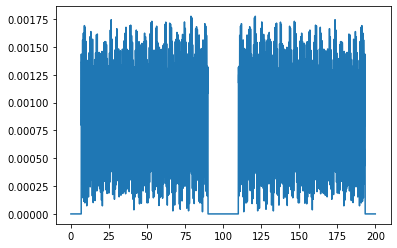

In [111]:
plt.plot(freq_full, np.abs(p_f))

In [112]:
p_t = np.real(scipy.fft.ifft(p_f))

In [130]:
import pickle
fn = 'simulated_pt.pkl'

with open(fn, 'wb') as f:
    pickle.dump({'p_t':p_t, 't':t}, f)

(0.0, 15.0)

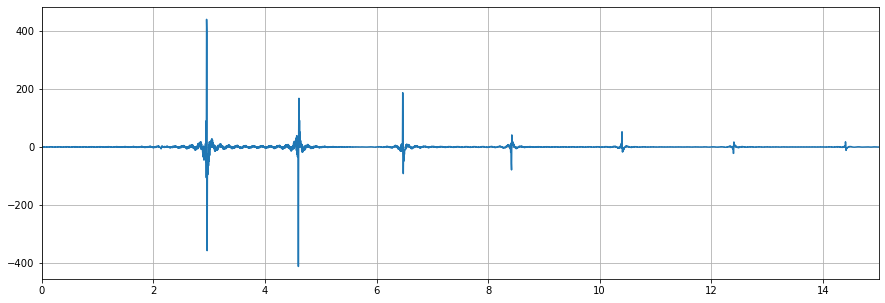

In [129]:
plt.figure(figsize=(15,5))
plt.plot(t, 1e6*p_t)
plt.grid()
plt.xlim((0,15))

### Get arrival times

In [168]:
NCCF = pyat_tools.create_NCCF(np.abs(signal.hilbert(p_t)))


dA = inversion.calc_prop_time(NCCF, 'dA').values[0]*-1
s1b0 = inversion.calc_prop_time(NCCF, 's1b0B').values[0]
s2b1 = inversion.calc_prop_time(NCCF, 's2b1B').values[0]
s3b2 = inversion.calc_prop_time(NCCF, 's3b2B').values[0]

print(dA, s1b0, s2b1, s3b2)

2.1416888174552136 2.959410630347835 4.619553492207257 6.472646637151635


(-1e-05, 1e-05)

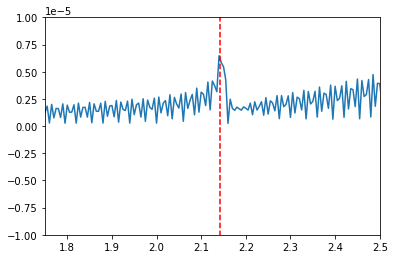

In [169]:
plt.plot(t, np.abs(signal.hilbert(p_t)))
ylims = plt.gca().get_ylim()

plt.plot([dA,dA], ylims, 'r--')
plt.plot([s1b0,s1b0], ylims, 'r--')
plt.plot([s2b1,s2b1], ylims, 'r--')
plt.plot([s3b2,s3b2], ylims, 'r--')


plt.xlim((1.75,2.5))
plt.ylim((-0.00001,0.00001))

## Look at spectrogram of TDGF

In [30]:
# Load SSP information
sspx = pyat_tools.load_ssp_from_file()
ssp_caldera_winter = pyat_tools.convert_SSP_arlpy(sspx, 0)[:-100]

# Write Environment File
fn = 'caldera'
pyat_tools.build_env_file(ssp_caldera_winter,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')


# Write field flp file
s_depths=[400] #meters
ranges =  [100] #km
r_depths = [400] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn)

# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 90

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

# Simulate with Kraken
pressures = pyat_tools.simulate_FDGF('caldera', freq_half, [1, 30], krakenc=False, verbose=True)

pt = np.real(scipy.fft.ifft(pressures))

  1%|          | 100/9001 [00:00<00:09, 903.69it/s]

removed .flp
N:	18000
To:	90 [s]
Δf	0.005555555555555556


100%|██████████| 9001/9001 [00:59<00:00, 152.19it/s]


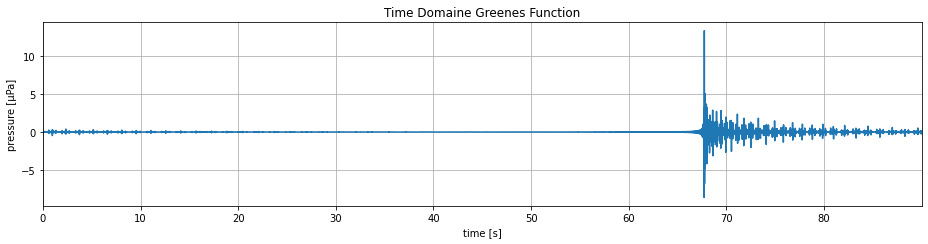

In [31]:
plt.figure(figsize=(13,3.5))
plt.plot(t, np.real(pt)/1e-6)
plt.grid()
plt.xlim((t[0],t[-1]))
plt.xlabel('time [s]')
plt.ylabel('pressure [μPa]')
plt.title('Time Domaine Greenes Function')

#plt.ylim((-200,200))
#plt.xlim((1.5,15))
plt.tight_layout()
#plt.savefig(f'figures/TDGF_1_90_zoomed_rough_rock.png',dpi=300)

In [32]:
pt_upsamp = signal.resample(pt, len(pt)*100)

In [33]:
f, t_spec, Sxx = signal.spectrogram(pt_upsamp, fs=20000, window='hann', nperseg=1024, noverlap=0.9, nfft=4096*4, detrend='constant', return_onesided=True, scaling='density', axis=- 1, mode='psd')

In [34]:
spec = xr.DataArray(10*np.log10(Sxx), dims=['frequency','time'], coords={'time':t_spec, 'frequency':f})

In [35]:
spec.loc[:100,:].hvplot(rasterize=True, width=1300, height=500, x='time', y='frequency', title='Spectrogram of TDGF', cmap='jet')

:DynamicMap   []
   :Image   [time,frequency]   (value)

## Simulate Seasonal TDGF

In [14]:
fn1 = 'caldera_winter'
fn2 = 'caldera_summer'
# Write Environment file
pyat_tools.build_env_file(ssp_caldera_winter,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn1}.env')
pyat_tools.build_env_file(ssp_caldera_summer,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn2}.env')
# Write field flp file
s_depths=[1499] #meters
ranges =  [3.2] #km
r_depths = [1499] # meters

pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn1)
pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn2)

removed .flp
removed .flp


In [15]:
# Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
Fs = 200
To = 15

t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To)

N:	3000
To:	15 [s]
Δf	0.03333333333333333


In [19]:
# Simulate with Kraken
pressures_winter = pyat_tools.simulate_FDGF('caldera_winter', freq_half, [1, 90], krakenc=False)
pressures_summer = pyat_tools.simulate_FDGF('caldera_summer', freq_half, [1, 90], krakenc=False)


100%|██████████| 1501/1501 [00:52<00:00, 28.37it/s]


In [20]:
pt_winter = xr.DataArray(np.real(scipy.fft.ifft(pressures_winter)), dims=['time'], coords={'time':t}, name='G(t) winter')
pt_summer = xr.DataArray(np.real(scipy.fft.ifft(pressures_summer)), dims=['time'], coords={'time':t}, name='G(t) summer')


In [22]:
pt_winter.hvplot(grid=True, label='winter')* pt_summer.hvplot(label='summer')

:Overlay
   .Curve.Winter :Curve   [time]   (G(t) winter)
   .Curve.Summer :Curve   [time]   (G(t) summer)

In [30]:
xr.concat([pt_winter, pt_summer], dim='date')

<xarray.DataArray 'G(t) winter' (date: 2, time: 3000)>
array([[-4.78419585e-07,  2.40458011e-07,  3.54809501e-08, ...,
         4.90768812e-07, -7.77596806e-07,  5.33345940e-07],
       [-5.21395455e-07,  2.78993539e-07, -2.06270011e-08, ...,
         4.93262643e-07, -7.84592156e-07,  5.59115167e-07]])
Coordinates:
  * time     (time) float64 0.0 0.005 0.01 0.015 0.02 ... 14.98 14.98 14.99 15.0
Dimensions without coordinates: date

In [31]:
pt_winter.shape

(3000,)

# Play with multiprocessing

In [3]:
def function(k):
    return mp.current_process().name

In [4]:
a_pool = mp.Pool(processes = mp.cpu_count())
result = a_pool.map(function, range(100))

Process ForkPoolWorker-4:
Process ForkPoolWorker-11:
Process ForkPoolWorker-9:
Process ForkPoolWorker-5:
Process ForkPoolWorker-12:
Process ForkPoolWorker-8:
Process ForkPoolWorker-7:
Process ForkPoolWorker-6:
Process ForkPoolWorker-3:
Process ForkPoolWorker-2:
Process ForkPoolWorker-1:
Process ForkPoolWorker-10:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):


In [2]:
# build function that calculates the TDGF for a single SSP, but can be iterated over

def simulate_single_ssp(ssp):
    '''
    simulate_single_SSP builds upon pyat_tools.simulate_TDGF() and calculates
        the 
    
    Parameters
    ----------
    ssp : numpy array
        sound speed profile in numpy format required by arlpy
        
    Returns
    -------
    TDGF : numpy array
    '''
    
    process_name = mp.current_process().name
    
    # Write Environment File
    fn = f'multiprocessing/caldera_{process_name}'
    
    pyat_tools.build_env_file(ssp,'env_files/caldera_top_roughrock.txt','env_files/caldera_bottom_roughrock.txt', f'{fn}.env')
    
    # Build Frequency vector to accurate sample DTFT (so that x(t) can be reconstructed)
    Fs = 200
    To = 20
    t, freq_half, freq_full = pyat_tools.get_freq_time_vectors(Fs, To, verbose=False)

    # Write field flp file
    s_depths=[1499] #meters
    ranges =  [3.2] #km
    r_depths = [1499] # meters

    pyat_tools.write_flp_file(s_depths, ranges, r_depths, fn, verbose=False)
    
    # Simulate with Kraken
    pressures = pyat_tools.simulate_FDGF(fn, freq_half, [1, 90], krakenc=False)

    pt = np.real(scipy.fft.ifft(pressures))
    
    return pt

### Get SSPs

In [3]:
fn = '/Volumes/Ocean_Acoustics/CTD Data/Axial_Base_201hr_avg_SSP.nc'
ssps = xr.load_dataarray(fn)

In [4]:
ssps_single_year = ssps[::200,:].loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2017-01-01'),11:1527]

In [5]:
ssp_ls = []

for k in range(len(ssps_single_year)):
    ssp_ls.append(pyat_tools.convert_SSP_arlpy(ssps_single_year,k))

In [7]:
len(ssp_ls)

44

### Simulate TDGF for every SSP

In [8]:
a_pool = mp.Pool(processes = mp.cpu_count())
#result = a_pool.map(simulate_single_ssp, ssp_ls)

  0%|          | 0/2001 [00:00<?, ?it/s]

In [ ]:
r = list(tqdm(a_pool.imap(simulate_single_ssp, ssp_ls), total=len(ssp_ls)))

  0%|          | 0/44 [00:00<?, ?it/s]

In [10]:
import pickle
fn = 'TDGFs2.pkl'

with open(fn, 'wb') as f:
    pickle.dump(r, f)

In [11]:
TDGFs_np = np.array(r)

In [12]:
TDGFs_np.shape

(44, 4000)

In [13]:
# get time coord
Fs = 200
To = 20
t, _, _ = pyat_tools.get_freq_time_vectors(Fs, To, verbose=False)

In [14]:
TDGFs = xr.DataArray(
    TDGFs_np,
    dims=['dates','delay'],
    coords={
        'dates':ssps_single_year.time.values,
        'delay':t
    },
    name='Simulated TDGFs'
)

fn = 'yearlong_TDGF_simulated.nc'

TDGFs.to_netcdf(fn)

In [15]:
TDGFs.hvplot(x='dates', y='delay')

:Image   [dates,delay]   (Simulated TDGFs)

### Calculate Arrival Times using peak interpolation

In [17]:
from Noise_Interferometry.Modules import inversion

In [27]:
s1b0_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [593-50, 593+50])
s2b1_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [900-100, 900+100])
s3b2_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [1295-50, 1295+50])
s4b3_proptime = inversion.calc_prop_time(TDGFs, 'custom', peak_slice = [1684-50, 1684+50])

dt_s1b0 = 1000*(s1b0_proptime.max() - s1b0_proptime.min()).values
dt_s2b1 = 1000*(s2b1_proptime.max() - s2b1_proptime.min()).values
dt_s3b2 = 1000*(s3b2_proptime.max() - s3b2_proptime.min()).values
dt_s4b3 = 1000*(s4b3_proptime.max() - s4b3_proptime.min()).values

In [28]:
dt_s1b0, dt_s2b1, dt_s3b2, dt_s4b3

(1.4282161815102334, 35.10183411823142, 4.732393719058869, 5.703881651960785)

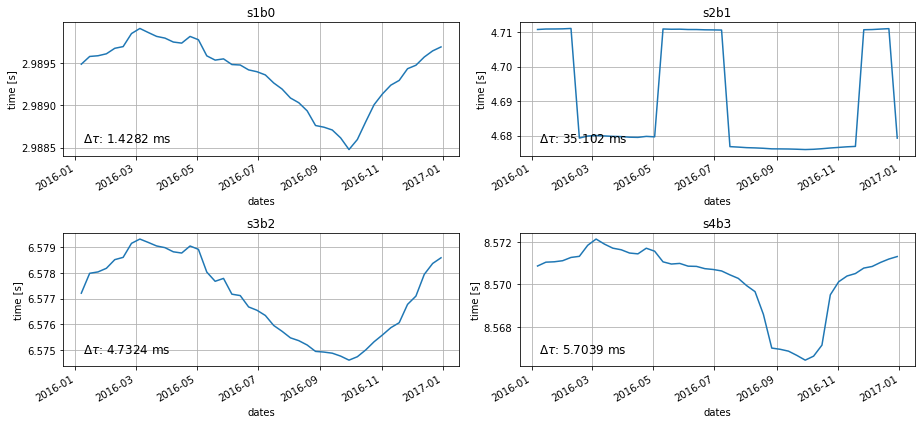

In [29]:
plt.figure(figsize=(13,6))

plt.subplot(2,2,1)
s1b0_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s1b0')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s1b0:0.5} ms', transform=ax.transAxes, fontsize=12)


plt.subplot(2,2,2)
s2b1_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s2b1')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s2b1:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.subplot(2,2,3)
s3b2_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s3b2')
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s3b2:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.subplot(2,2,4)
s4b3_proptime.plot()
plt.grid()
plt.ylabel('time [s]')
plt.title('s4b3')
plt.tight_layout()
ax = plt.gca()
plt.text(0.05, 0.1, f'$\Delta \\tau$: {dt_s4b3:0.5} ms', transform=ax.transAxes, fontsize=12)

plt.savefig('simulated_arrival_times.png', dpi=300)

## Get 6-year average TDGF and arrival times

In [1]:
import xarray as xr
import pandas as pd
import pyat_tools
from matplotlib import pyplot as plt
from Noise_Interferometry.Modules import inversion
import numpy as np
from scipy import signal
import hvplot.xarray

%load_ext autoreload
%autoreload 2

In [2]:
fn = '/Volumes/Ocean_Acoustics/CTD Data/Axial_Base_201hr_avg_SSP.nc'
ssps = xr.load_dataarray(fn)

In [3]:
ssps_single_year = ssps[::200,:].loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2017-01-01'),11:1500]

In [4]:
ssp_arlpy = pyat_tools.convert_SSP_arlpy(ssps_single_year.mean('time'), 0)

In [71]:
pt = pyat_tools.simulate_single_ssp(ssp_arlpy)

100%|██████████| 2001/2001 [01:11<00:00, 28.09it/s]


In [72]:
t,_,_ = pyat_tools.get_freq_time_vectors(200, 30, verbose=False)
pt_pad = np.hstack((pt, np.zeros(2000)))

pt_pad = np.expand_dims(np.hstack((np.flipud(pt_pad[1:]), pt_pad)),0)

NCCF_sim = xr.DataArray(
    pt_pad,
    dims=['dates','delay'],
    coords = {'delay':np.hstack((-np.flipud(t[1:]), t))}
)

In [73]:
NCCF_simc = xr.DataArray(
    np.abs(signal.hilbert(NCCF_sim)),
    dims=['dates','delay'],
    coords={'delay':NCCF_sim.delay}, 
    name='Hilbert magnitude simulated NCCF')

In [74]:
NCCF_simc

<xarray.DataArray 'Hilbert magnitude simulated NCCF' (dates: 1, delay: 11999)>
array([[4.99890486e-11, 5.00947333e-11, 4.98837071e-11, ...,
        4.98837071e-11, 5.00947333e-11, 4.99890486e-11]])
Coordinates:
  * delay    (delay) float64 -30.0 -29.99 -29.98 -29.98 ... 29.98 29.99 30.0
Dimensions without coordinates: dates

In [75]:
prop_times = {}

prop_times['d'] = -1*inversion.calc_prop_time(NCCF_simc, 'dA',verbose=False).values[0]
prop_times['s1b0'] = inversion.calc_prop_time(NCCF_simc, 's1b0B',verbose=False).values[0]
prop_times['s2b1'] = inversion.calc_prop_time(NCCF_simc, 's2b1B',verbose=False).values[0]
prop_times['s3b2'] = inversion.calc_prop_time(NCCF_simc, 's3b2B',verbose=False).values[0]

print(prop_times)

{'d': 2.1420902736405885, 's1b0': 2.9592706879764696, 's2b1': 4.61936691191464, 's3b2': 6.472292345167488}


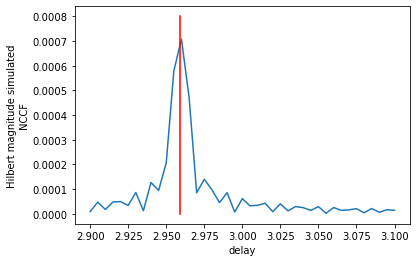

In [76]:
NCCF_simc.loc[:,2.9:3.1].plot()
plt.plot([prop_times['s1b0'], prop_times['s1b0']], [-0.000,0.0008], 'red')

#### Now do it for constant sound speed

In [6]:
c0 = ssps_single_year.mean()
c0

<xarray.DataArray '201 hour average SSP' ()>
array(1480.13167186)

In [58]:
ssp = np.ones(len(ssp_arlpy))*c0.values
ssp_arlpy_const = ssp_arlpy
ssp_arlpy_const[:,1] = ssp

In [59]:
pt = pyat_tools.simulate_single_ssp(ssp_arlpy_const)

100%|██████████| 2001/2001 [01:11<00:00, 28.10it/s]


In [60]:
t,_,_ = pyat_tools.get_freq_time_vectors(200, 30, verbose=False)
pt_pad = np.hstack((pt, np.zeros(2000)))

pt_pad = np.expand_dims(np.hstack((np.flipud(pt_pad[1:]), pt_pad)),0)

pt_padc = np.abs(signal.hilbert(pt_pad))

NCCF_sim = xr.DataArray(
    pt_padc,
    dims=['dates','delay'],
    coords = {'delay':np.hstack((-np.flipud(t[1:]), t))}
)

In [61]:
prop_times_c0 = {}

prop_times_c0['d'] = -1*inversion.calc_prop_time(NCCF_sim, 'dA',verbose=False).values[0]
prop_times_c0['s1b0'] = inversion.calc_prop_time(NCCF_sim, 's1b0B',verbose=False).values[0]
prop_times_c0['s2b1'] = inversion.calc_prop_time(NCCF_sim, 's2b1B',verbose=False).values[0]
prop_times_c0['s3b2'] = inversion.calc_prop_time(NCCF_sim, 's3b2B',verbose=False).values[0]

print(prop_times_c0)

{'d': 2.1518053904100616, 's1b0': 2.9594750700101993, 's2b1': 4.6196521823679255, 's3b2': 6.472726277752508}


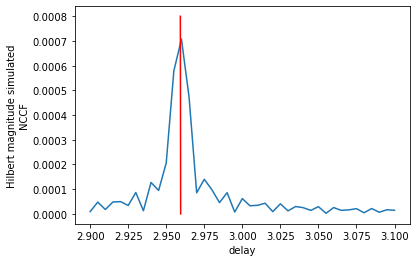

In [77]:
NCCF_simc.loc[:,2.9:3.1].plot()
plt.plot([prop_times_c0['s1b0'], prop_times['s1b0']], [-0.000,0.0008], 'red')

## Geometric Approximation

In [62]:
c0

<xarray.DataArray '201 hour average SSP' ()>
array(1480.13167186)

In [63]:
R = 3186 #m
D = 1500 #m

L_s1b0 = 2*np.sqrt((R/2)**2 + D**2)
L_s2b1 = 4*np.sqrt((R/4)**2 + D**2)
L_s3b2 = 6*np.sqrt((R/6)**2 + D**2)

In [64]:
s1b0_geo = L_s1b0/c0.values
s2b1_geo = L_s2b1/c0.values
s3b2_geo = L_s3b2/c0.values

In [65]:
prop_time_geo = {'s1b0':s1b0_geo, 's2b1':s2b1_geo, 's3b2':s3b2_geo}

In [66]:
print(prop_time_geo)

{'s1b0': 2.956587902063566, 's2b1': 4.5897423350603415, 's3b2': 6.450292435355626}
